<a href="https://colab.research.google.com/github/Ingenieco/tf_aa_uao/blob/main/Notebook_no_supervisado.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import geopandas as gpd
import seaborn as sns
import statsmodels.api as sm
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
from statsmodels.stats.outliers_influence import variance_inflation_factor
import folium



In [ ]:
# Load the data file into the environment
datos = pd.read_csv("/content/medellin_apartamentos_venta.csv")

# Check if the data file is loaded correctly
print(datos.head())

                                     id       price  builtArea  \
0  7a8c548b-da80-4d3c-9c0f-67ab50a34d75  1450000000     280.00   
1  1865d74c-7f78-464b-bc20-72022e14e688   225000000      54.78   
2  003947b0-eb82-4915-a269-fdb9b0e99fec   185000000      70.00   
3  0e727caa-b0c8-4cb7-80c0-6f17bb039707   410000000      90.00   
4  2620318f-415f-412d-8430-0f71c1afe436   300000000      80.00   

   pricePerBuiltSqm  stratum  \
0      5.178571e+06      6.0   
1      4.107338e+06      4.0   
2      2.642857e+06      4.0   
3      4.555556e+06      5.0   
4      3.750000e+06      1.0   

                                            location  \
0  0101000020E6100000BDA94885B1E352C0EA002D0208BC...   
1  0101000020E6100000E36BCF2C09E452C0622D3E05C0F8...   
2  0101000020E6100000C7293A92CBE352C0F323D97E8D07...   
3  0101000020E6100000F299EC9FA7E552C0317BD976DAFA...   
4  0101000020E610000040A4DFBE0EE752C07023658BA4DD...   

                                                 url  \
0  https://www.me

In [ ]:
datos.columns
len(datos.columns)


53

In [ ]:
geometry = [Point(xy) for xy in zip(datos.long, datos.lat)]

In [ ]:
geodatos = gpd.GeoDataFrame(datos, geometry = geometry)

In [ ]:
geodatos.crs = "EPSG:4326"


<Axes: >

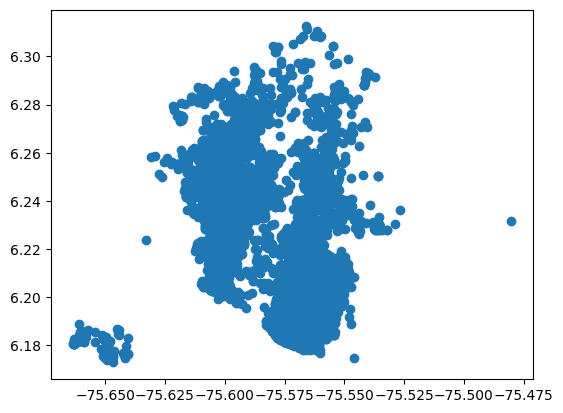

In [ ]:
geodatos.plot()


In [ ]:
geodatos.head()


,id,price,builtArea,pricePerBuiltSqm,stratum,location,url,name,active,isSuspicious,...,hasGreenZones,isResidentialComplex,hasConcierge,hasVisitorParking,hasPool,city_data_point,age,long,lat,geometry
0,7a8c548b-da80-4d3c-9c0f-67ab50a34d75,1450000000,280.00,5.178571e+06,6.0,0101000020E6100000BDA94885B1E352C0EA002D0208BC...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Los Balsos, Medellín",True,False,...,True,True,True,False,True,7306a24c-5b86-46a2-8cf4-c8346e943617,NaN,-75.557710,6.183624,POINT (-75.55771 6.18362)
1,1865d74c-7f78-464b-bc20-72022e14e688,225000000,54.78,4.107338e+06,4.0,0101000020E6100000E36BCF2C09E452C0622D3E05C0F8...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Bombona, Medellín",True,False,...,False,False,False,False,False,2c414e2c-33b1-4854-a6c5-e91c26bd7a2c,NaN,-75.563060,6.242920,POINT (-75.56306 6.24292)
2,003947b0-eb82-4915-a269-fdb9b0e99fec,185000000,70.00,2.642857e+06,4.0,0101000020E6100000C7293A92CBE352C0F323D97E8D07...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Prado centro , Medellín",True,False,...,False,False,False,True,False,c0c2c84d-bf89-42a9-8945-49975f3ffa8e,NaN,-75.559300,6.257376,POINT (-75.55930 6.25738)
3,0e727caa-b0c8-4cb7-80c0-6f17bb039707,410000000,90.00,4.555556e+06,5.0,0101000020E6100000F299EC9FA7E552C0317BD976DAFA...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, SAN JOAQUIN, Medellín",True,False,...,False,False,False,False,False,81f9659c-4144-447f-8173-4a6124aef008,NaN,-75.588356,6.244974,POINT (-75.58836 6.24497)
4,2620318f-415f-412d-8430-0f71c1afe436,300000000,80.00,3.750000e+06,1.0,0101000020E610000040A4DFBE0EE752C07023658BA4DD...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, BELEN, Medellín",False,False,...,False,False,False,False,False,17c77960-c6db-419f-b627-d747996c5be8,NaN,-75.610275,6.216448,POINT (-75.61028 6.21645)


In [ ]:
geodatos.columns


Index(['id', 'price', 'builtArea', 'pricePerBuiltSqm', 'stratum', 'location',
       'url', 'name', 'active', 'isSuspicious', 'isForRent', 'updatedAt',
       'createdAt', 'deactivatedAt', 'administrationFee', 'floor', 'isDuplex',
       'privateArea', 'rooms', 'toilets', 'parkingSpaces', 'hasServiceRoom',
       'hasServiceToilet', 'hasBalcony', 'hasLaundryZone', 'hasDeposit',
       'hasStudy', 'isExterior', 'hasTerrace', 'terraceArea', 'ageId',
       'listingSourceId', 'neighborhoodId', 'cityId', 'parkingTypeId',
       'elevators', 'bogotaDataPointId', 'listingCode', 'descriptionText',
       'listingJSON', 'hasCommunalHall', 'hasTennisCourt', 'hasSoccerField',
       'hasKidsPlayZone', 'hasGreenZones', 'isResidentialComplex',
       'hasConcierge', 'hasVisitorParking', 'hasPool', 'city_data_point',
       'age', 'long', 'lat', 'geometry'],
      dtype='object')

In [ ]:
geodatos = geodatos.dropna(axis = 1, how = "all")


In [ ]:
len(geodatos.columns)
geodatos.columns

Index(['id', 'price', 'builtArea', 'pricePerBuiltSqm', 'stratum', 'location',
       'url', 'name', 'active', 'isSuspicious', 'isForRent', 'updatedAt',
       'createdAt', 'deactivatedAt', 'administrationFee', 'floor', 'isDuplex',
       'privateArea', 'rooms', 'toilets', 'parkingSpaces', 'hasServiceRoom',
       'hasServiceToilet', 'hasBalcony', 'hasLaundryZone', 'hasDeposit',
       'hasStudy', 'isExterior', 'hasTerrace', 'terraceArea', 'ageId',
       'listingSourceId', 'cityId', 'parkingTypeId', 'elevators',
       'listingCode', 'descriptionText', 'listingJSON', 'hasCommunalHall',
       'hasTennisCourt', 'hasSoccerField', 'hasKidsPlayZone', 'hasGreenZones',
       'isResidentialComplex', 'hasConcierge', 'hasVisitorParking', 'hasPool',
       'city_data_point', 'long', 'lat', 'geometry'],
      dtype='object')

In [ ]:
geodatos[['price', 'pricePerBuiltSqm', 'isDuplex', 'hasServiceToilet']].head()

,price,pricePerBuiltSqm,isDuplex,hasServiceToilet
0,1450000000,5.178571e+06,False,False
1,225000000,4.107338e+06,False,False
2,185000000,2.642857e+06,False,False
3,410000000,4.555556e+06,False,False
4,300000000,3.750000e+06,False,False


In [ ]:
geodatos['rooms'].shape


(9883,)

In [ ]:
geodatos[geodatos['price'] > 60000000000].head(10)


,id,price,builtArea,pricePerBuiltSqm,stratum,location,url,name,active,isSuspicious,...,hasKidsPlayZone,hasGreenZones,isResidentialComplex,hasConcierge,hasVisitorParking,hasPool,city_data_point,long,lat,geometry
3055,53edc5d5-4254-41d5-a463-8e31d2fa8e1e,430000000000,140.0,3.071429e+09,5.0,0101000020E6100000D46531B1F9E452C038E27FE14BF7...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, Conquistadores, Medellín",True,True,...,False,False,True,False,False,False,84968e9d-159e-4ed0-a727-f5bd8e806f46,-75.57774,6.241500,POINT (-75.57774 6.24150)
5418,92a073e8-2031-4ce1-9560-036cd54ed18d,500000000000,180.0,2.777778e+09,4.0,0101000020E6100000DF6C73637AE652C0BC4049810508...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, LA FLORESTA, Medellín",True,True,...,False,False,True,False,False,False,dcea624c-dd8b-4466-849a-530b259bd9a4,-75.60122,6.257834,POINT (-75.60122 6.25783)
5800,9d4e58ae-fece-477c-ae1a-d877accc1ece,980000000000,157.0,6.242038e+09,5.0,0101000020E6100000601F9DBAF2E352C073124A5F08D1...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, LA FLORIDA, Medellín",False,True,...,True,True,True,True,False,True,1fc58bfe-bce0-4698-bc89-c0e86b5ebb0e,-75.56169,6.204134,POINT (-75.56169 6.20413)
6396,ac936d8d-b907-4f38-a78a-160d18f2871f,393000000000,93.0,4.225806e+09,5.0,0101000020E6100000462575029AE652C0A19C0D9EAEEB...,https://www.metrocuadrado.com/inmueble/venta-a...,"Apartamento en Venta, BELEN, Medellín",True,True,...,False,False,True,False,False,False,3c68d3ed-751b-4538-b157-1a39a7d4fb91,-75.60315,6.230158,POINT (-75.60315 6.23016)


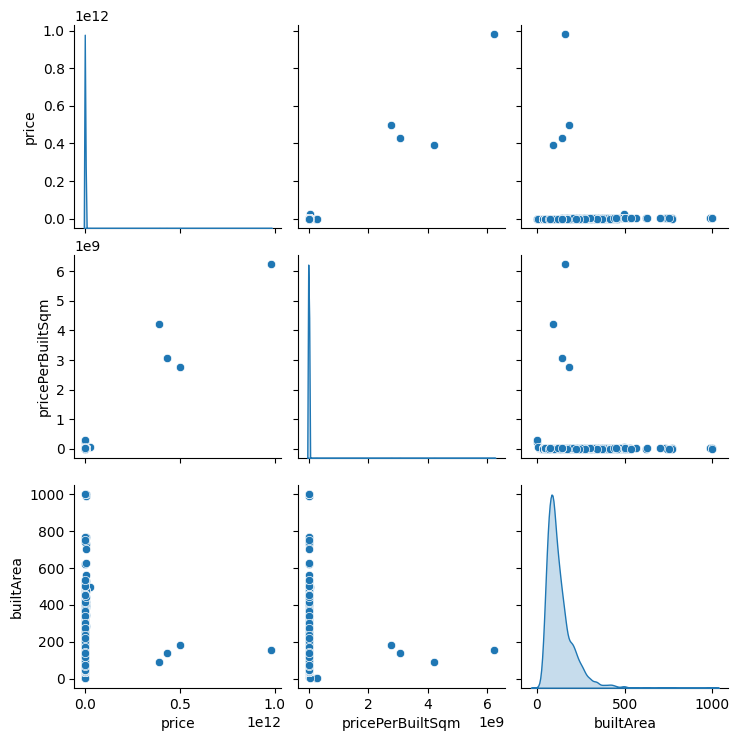

In [ ]:
sns.pairplot(geodatos[['price', 'pricePerBuiltSqm', 'builtArea']], diag_kind = 'kde')
plt.show()

In [ ]:
estrato_cuartos = pd.crosstab(geodatos['stratum'],
                              geodatos['rooms'],
                              colnames = ['Num. Cuartos'],
                              rownames = ['Estrato'])

estrato_baños = pd.crosstab(geodatos['stratum'],
                            geodatos['toilets'],
                            colnames = ['Num. Baños'],
                            rownames = ['Estrato'])

estrato_parqueaderos = pd.crosstab(geodatos['stratum'],
                                   geodatos['parkingSpaces'],
                                   colnames = ['Num. parqueaderos'],
                                   rownames = ['Estrato'])

<Axes: xlabel='Num. parqueaderos', ylabel='Estrato'>

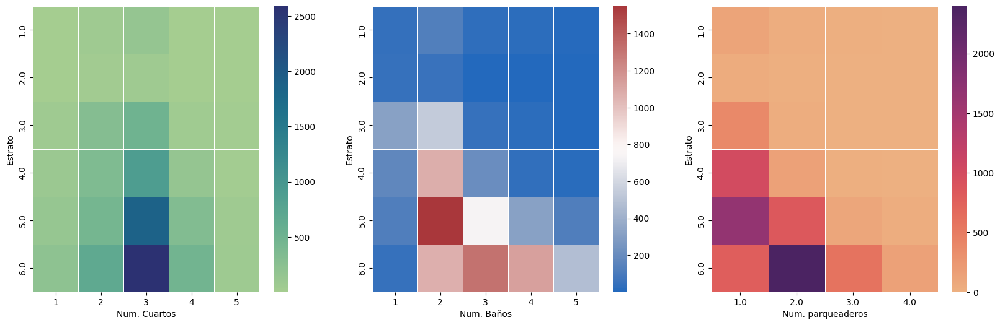

In [ ]:
fig, ax = plt.subplots(1, 3, figsize = (20,6))

sns.heatmap(estrato_cuartos, linewidths = 0.5, linecolor = 'white', ax = ax[0], cmap = 'crest')


sns.heatmap(estrato_baños, linewidths = 0.5, linecolor = 'white', ax = ax[1], cmap = 'vlag')

sns.heatmap(estrato_parqueaderos, linewidths = 0.5, linecolor = 'white', ax = ax[2], cmap = 'flare')

In [ ]:
n = folium.Map(location = [20,0], tiles = "OpenStreetMap", zoom_start = 1)

for punto in geodatos.itertuples():
    folium.CircleMarker(
        location = [punto.lat, punto.long],
        popup = punto.price,
        radius = float(punto.builtArea/100),
        color = '#69b3a2',
        fill = True,
        fill_color = '#69b3a2'
   ).add_to(n)

# A title can be added to the map, if desired.
n.get_root().html.add_child(folium.Element("<h3 align='center'>Mapa ventas de inmuebles Medellín</h3>"))
n

### DESDE ACA EMPIEZA

### **MODELO DE REGRESION LINEAL MULTIVARIABLE**

se construirá un modelo multivariado predictivo con un enfoque hacia atrás. Pretenderemos verificar si una regresión lineal multivariada puede predecir el precio de los imuebles, en función de las características seleccionadas o más favorables del conjunto de datos estudiado según el modelo:

**1. ELECCIONES DE LAS VARIABLES CON LAS CUALES SE TRABAJARAN**


In [ ]:
# Observamos las variables y el tipo de variable
column_names = geodatos.columns
column_types = geodatos.dtypes
print("Column Names:")
print(column_names)
print("\nData Types:")
print(column_types)



Column Names:
Index(['id', 'price', 'builtArea', 'pricePerBuiltSqm', 'stratum', 'location',
       'url', 'name', 'active', 'isSuspicious', 'isForRent', 'updatedAt',
       'createdAt', 'deactivatedAt', 'administrationFee', 'floor', 'isDuplex',
       'privateArea', 'rooms', 'toilets', 'parkingSpaces', 'hasServiceRoom',
       'hasServiceToilet', 'hasBalcony', 'hasLaundryZone', 'hasDeposit',
       'hasStudy', 'isExterior', 'hasTerrace', 'terraceArea', 'ageId',
       'listingSourceId', 'cityId', 'parkingTypeId', 'elevators',
       'listingCode', 'descriptionText', 'listingJSON', 'hasCommunalHall',
       'hasTennisCourt', 'hasSoccerField', 'hasKidsPlayZone', 'hasGreenZones',
       'isResidentialComplex', 'hasConcierge', 'hasVisitorParking', 'hasPool',
       'city_data_point', 'long', 'lat', 'geometry'],
      dtype='object')

Data Types:
id                        object
price                      int64
builtArea                float64
pricePerBuiltSqm         float64
stratum       

In [ ]:
#ELIMINAMOS LAS VARIABLES TIPO BOOL
geodatos2 = geodatos.select_dtypes(exclude='bool')


In [ ]:
#eliminamos las variables tipo object
geodatos2 = geodatos2.select_dtypes(exclude='object')


In [ ]:
geodatos2 = geodatos2.drop(columns=['administrationFee', 'geometry'])

In [ ]:
# Observamos las variables y el tipo de variable
column_names = geodatos2.columns
column_types = geodatos2.dtypes
print("Column Names:")
print(column_names)
print("\nData Types:")
print(column_types)

Column Names:
Index(['price', 'builtArea', 'pricePerBuiltSqm', 'stratum', 'floor',
       'privateArea', 'rooms', 'toilets', 'parkingSpaces', 'terraceArea',
       'elevators', 'long', 'lat'],
      dtype='object')

Data Types:
price                 int64
builtArea           float64
pricePerBuiltSqm    float64
stratum             float64
floor               float64
privateArea         float64
rooms                 int64
toilets               int64
parkingSpaces       float64
terraceArea         float64
elevators           float64
long                float64
lat                 float64
dtype: object


In [ ]:
#deacuerdo al analisis de estas variables se decidio que cuando no se tiene
#ningun valor se le asignara un 0.
geodatos2['floor'] = geodatos2['floor'].fillna(0)
geodatos2['parkingSpaces'] = geodatos2['parkingSpaces'].fillna(0)
geodatos2['terraceArea'] = geodatos2['terraceArea'].fillna(0)
geodatos2['elevators'] = geodatos2['elevators'].fillna(0)
geodatos2['privateArea'] = geodatos2['privateArea'].fillna(0)
print(geodatos2.head())

        price  builtArea  pricePerBuiltSqm  stratum  floor  privateArea  \
0  1450000000     280.00      5.178571e+06      6.0    0.0       280.00   
1   225000000      54.78      4.107338e+06      4.0    0.0        54.78   
2   185000000      70.00      2.642857e+06      4.0    3.0        70.00   
3   410000000      90.00      4.555556e+06      5.0    0.0        90.00   
4   300000000      80.00      3.750000e+06      1.0    0.0        80.00   

   rooms  toilets  parkingSpaces  terraceArea  elevators       long       lat  
0      3        5            3.0          0.0        2.0 -75.557710  6.183624  
1      3        2            0.0          0.0        0.0 -75.563060  6.242920  
2      2        1            1.0          0.0        0.0 -75.559300  6.257376  
3      3        3            1.0          0.0        0.0 -75.588356  6.244974  
4      3        3            0.0          0.0        0.0 -75.610275  6.216448  


In [ ]:
# para la variable estado se realizo datos por imputacion
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy="median")
geodatos2["stratum"] = imputer.fit_transform(geodatos2[["stratum"]])
missing_values = geodatos2["stratum"].isnull().sum()
print(f"Number of missing values in 'Stratum': {missing_values}")

Number of missing values in 'Stratum': 0


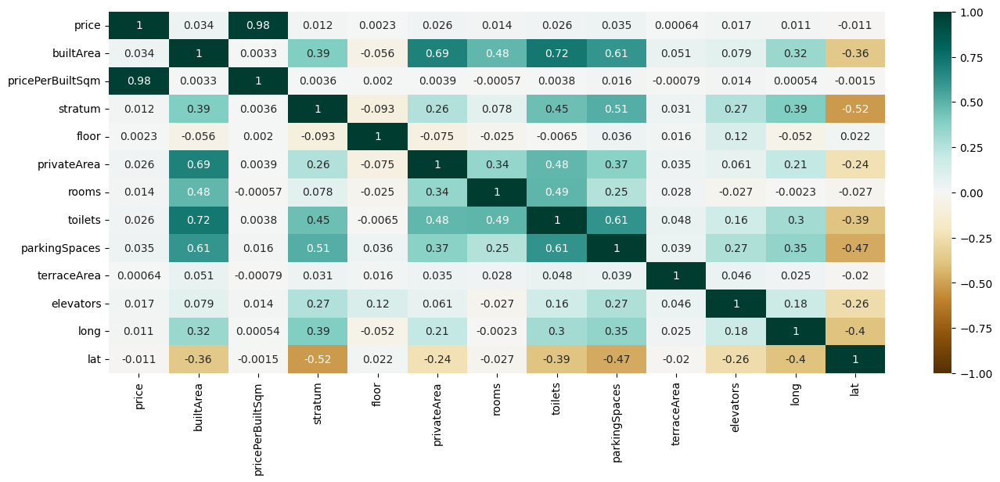

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = geodatos2.corr()

# Generate a heatmap of the correlation matrix
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(correlation_matrix, vmin=-1, vmax=1, annot=True, cmap="BrBG")

# Display the heatmap
plt.show()

## **2. TRANSFORMAMOS LA VARIABLE DEPENDIENTE**
con el fin de normalizarla



In [ ]:
geodatos2["TRF_price"] = np.log10(geodatos2["price"])



La normalización de datos con logaritmo es una técnica útil en el aprendizaje automático para tratar datos con distribuciones asimétricas, particularmente cuando los valores se concentran en un extremo y hay algunos valores atípicos en el otro.

Su principal beneficio radica en transformar la distribución de los datos hacia una forma más normal, lo que mejora el rendimiento de diversos algoritmos de aprendizaje automático.

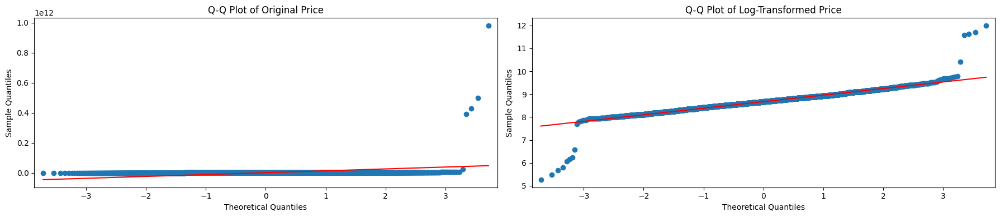

In [ ]:
#GRAFICAMOS LAS DOS VARIABLES

import statsmodels.api as sm

fig, axes = plt.subplots(1, 2, figsize=(18, 4))
# Q-Q plot for original price data
sm.qqplot(geodatos2["price"], line="s", ax=axes[0])
axes[0].set_title("Q-Q Plot of Original Price")

# Q-Q plot for log-transformed price data
sm.qqplot(geodatos2["TRF_price"], line="s", ax=axes[1])
axes[1].set_title("Q-Q Plot of Log-Transformed Price")
# Improve plot layout
plt.tight_layout()

# Display the plot
plt.show()

# **3. REALIZAMOS UNA PRUEBA ANOVA PARA CADA UNA DE LAS VARIABLES.**

la prueba ANOVA puede usarse para evaluar el ajuste general de un modelo de regresión lineal, identificar variables significativas y comprender interacciones, proporcionando información valiosa sobre los datos y las relaciones entre variables.

In [ ]:
import pandas as pd
from statsmodels.formula.api import ols

# Define the formula for the ANOVA model
formula = "TRF_price ~ builtArea"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.545
Model:                            OLS   Adj. R-squared:                  0.545
Method:                 Least Squares   F-statistic:                 1.186e+04
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:17   Log-Likelihood:                 2220.0
No. Observations:                9883   AIC:                            -4436.
Df Residuals:                    9881   BIC:                            -4422.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      8.3241      0.004   2217.584      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~ pricePerBuiltSqm"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.046
Method:                 Least Squares   F-statistic:                     472.5
Date:                Fri, 07 Jun 2024   Prob (F-statistic):          2.26e-102
Time:                        17:05:17   Log-Likelihood:                -1445.3
No. Observations:                9883   AIC:                             2895.
Df Residuals:                    9881   BIC:                             2909.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            8.6693      0.003  

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~stratum"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.346
Model:                            OLS   Adj. R-squared:                  0.346
Method:                 Least Squares   F-statistic:                     5226.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:17   Log-Likelihood:                 421.75
No. Observations:                9883   AIC:                            -839.5
Df Residuals:                    9881   BIC:                            -825.1
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.9701      0.010    796.319      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~floor"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.601
Date:                Fri, 07 Jun 2024   Prob (F-statistic):              0.107
Time:                        17:05:17   Log-Likelihood:                -1674.8
No. Observations:                9883   AIC:                             3354.
Df Residuals:                    9881   BIC:                             3368.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      8.6771      0.004   2439.713      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~privateArea"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.240
Model:                            OLS   Adj. R-squared:                  0.239
Method:                 Least Squares   F-statistic:                     3113.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:17   Log-Likelihood:                -322.77
No. Observations:                9883   AIC:                             649.5
Df Residuals:                    9881   BIC:                             663.9
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       8.5170      0.004   2259.179      

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~rooms"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.099
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     1083.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):          1.60e-225
Time:                        17:05:17   Log-Likelihood:                -1162.1
No. Observations:                9883   AIC:                             2328.
Df Residuals:                    9881   BIC:                             2343.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      8.3326      0.011    777.395      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~toilets"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.496
Model:                            OLS   Adj. R-squared:                  0.496
Method:                 Least Squares   F-statistic:                     9743.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:17   Log-Likelihood:                 1714.5
No. Observations:                9883   AIC:                            -3425.
Df Residuals:                    9881   BIC:                            -3411.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      8.1530      0.006   1440.869      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~parkingSpaces"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.466
Model:                            OLS   Adj. R-squared:                  0.466
Method:                 Least Squares   F-statistic:                     8609.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:17   Log-Likelihood:                 1420.3
No. Observations:                9883   AIC:                            -2837.
Df Residuals:                    9881   BIC:                            -2822.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         8.3558      0.004   2076.863

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~terraceArea"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     19.25
Date:                Fri, 07 Jun 2024   Prob (F-statistic):           1.16e-05
Time:                        17:05:18   Log-Likelihood:                -1666.5
No. Observations:                9883   AIC:                             3337.
Df Residuals:                    9881   BIC:                             3351.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       8.6731      0.003   3006.933      

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~elevators"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.059
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                     619.4
Date:                Fri, 07 Jun 2024   Prob (F-statistic):          1.17e-132
Time:                        17:05:18   Log-Likelihood:                -1375.7
No. Observations:                9883   AIC:                             2755.
Df Residuals:                    9881   BIC:                             2770.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      8.5903      0.004   1967.789      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~long"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.149
Model:                            OLS   Adj. R-squared:                  0.149
Method:                 Least Squares   F-statistic:                     1727.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:18   Log-Likelihood:                -880.17
No. Observations:                9883   AIC:                             1764.
Df Residuals:                    9881   BIC:                             1779.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    455.9668     10.764     42.362      0.0

In [ ]:
# Define the formula for the ANOVA model
formula = "TRF_price ~lat"

# Fit the ANOVA model
anova = ols(formula, data=geodatos2).fit()

# Print the ANOVA table
print(anova.summary())

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.231
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     2966.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:18   Log-Likelihood:                -379.12
No. Observations:                9883   AIC:                             762.2
Df Residuals:                    9881   BIC:                             776.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     41.8509      0.609     68.694      0.0


### 4**. Regresión lineal multivariable**
Vamos a identificar qué características de las ya seleccionadas, están asociadas linealmente con el precio variable del inmuebel, teniendo ahora en cuenta el efecto simultáneo que tienen entre sí.

Usaremos el método de pasos y la dirección hacia atrás.

**Simplicidad e interpretabilidad:** La regresión lineal es un modelo simple e intuitivo, lo que facilita la comprensión e interpretación de la relación entre las características de entrada y la variable objetivo (precio). Esto puede ser valioso para obtener información sobre los factores que influyen en los patrones de precios.

**Eficiencia computacional:** La regresión lineal es computacionalmente eficiente, lo que significa que puede entrenarse y usarse para predicciones rápidamente, incluso en conjuntos de datos grandes. Esto lo hace adecuado para aplicaciones en tiempo real o situaciones donde los recursos computacionales son limitados

In [ ]:
#REVISAMOS QUE TODO LA INFORMACION ESTE BIEN
null_values = geodatos2.isnull().sum()
empty_values = geodatos2.isna().sum()
categorical_values = geodatos2.select_dtypes(include=["object"]).nunique()

print("Null Values:\n", null_values)
print("\nEmpty Values:\n", empty_values)
print("\nNumber of Unique Values in Categorical Columns:\n", categorical_values)

Null Values:
 price               0
builtArea           0
pricePerBuiltSqm    0
stratum             0
floor               0
privateArea         0
rooms               0
toilets             0
parkingSpaces       0
terraceArea         0
elevators           0
long                0
lat                 0
TRF_price           0
dtype: int64

Empty Values:
 price               0
builtArea           0
pricePerBuiltSqm    0
stratum             0
floor               0
privateArea         0
rooms               0
toilets             0
parkingSpaces       0
terraceArea         0
elevators           0
long                0
lat                 0
TRF_price           0
dtype: int64

Number of Unique Values in Categorical Columns:
 Series([], dtype: float64)


In [ ]:
geodatos2.drop("price", axis=1, inplace=True)

4.1 **DATOS DE PRUEBA Y ENTRENAMIENTO**

In [ ]:

import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
dependent_variable = 'TRF_price'
independent_vars = list(geodatos2.columns)
independent_vars.remove(dependent_variable)

# Separación de datos en entrenamiento y prueba
train_data, test_data = train_test_split(geodatos2, test_size=0.2, random_state=42)

X_train = train_data[independent_vars]
y_train = train_data[dependent_variable]
X_test = test_data[independent_vars]
y_test = test_data[dependent_variable]

# Añadir constante a los datos de entrenamiento
X_train = sm.add_constant(X_train)
X_test = sm.add_constant(X_test)


4.2 MODELO LINEAL


In [ ]:
# Ajustar el modelo OLS
model = sm.OLS(y_train, X_train).fit()
print(model.summary())

# Calcular el VIF para detectar multicolinealidad
def calculate_vif(data, independent_vars):
    X = data[independent_vars]
    X = sm.add_constant(X)
    vif_data = pd.DataFrame()
    vif_data["variable"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    return vif_data

vif_data = calculate_vif(train_data, independent_vars)
print(vif_data)

                            OLS Regression Results                            
Dep. Variable:              TRF_price   R-squared:                       0.753
Model:                            OLS   Adj. R-squared:                  0.753
Method:                 Least Squares   F-statistic:                     2010.
Date:                Fri, 07 Jun 2024   Prob (F-statistic):               0.00
Time:                        17:05:18   Log-Likelihood:                 4180.9
No. Observations:                7906   AIC:                            -8336.
Df Residuals:                    7893   BIC:                            -8245.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               44.8312      7.406  

ANALISIS DEL RESULTADO

 AIC: -8336 y BIC: -8245, que son medidas de la calidad del modelo, penalizando por el número de variables. Valores más bajos indican un mejor modelo.

Algunas variables no son significativas:

floor: 0.0004 (P = 0.140)

privateArea: -1.181e-05 (P = 0.535)

terraceArea: -4.725e-05 (P = 0.481)

4.3 VALIDACION CRUZADA

La validación cruzada se realiza para asegurar que un modelo de machine learning sea robusto y generalizable, no solo ajustado a un subconjunto específico de datos. Al utilizar diferentes segmentos de los datos como conjuntos de entrenamiento y prueba, este método ayuda a evaluar cómo el modelo se desempeñará con datos no vistos anteriorment

In [ ]:
from sklearn.model_selection import cross_val_score
import numpy as np

# Validación cruzada en el conjunto de entrenamiento
model_lr = LinearRegression()
scores = cross_val_score(model_lr, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
print("Cross-validated MSE:", -np.mean(scores))


Cross-validated MSE: 0.0211518124493694


El MSE de 0.02115 es relativamente bajo, lo que en principio sugiere que el modelo tiene un buen desempeño en términos de la precisión de sus predicciones.

4.3 REGRESION RIDGE Y LASSO

La regresión Ridge y Lasso son técnicas de regularización utilizadas en modelos de regresión lineal para prevenir el sobreajuste y mejorar la generalización del modelo sobre datos no vistos

In [ ]:
from sklearn.linear_model import Ridge, Lasso

# Ridge Regression
ridge = Ridge(alpha=1.0)
ridge.fit(X_train, y_train)
ridge_preds = ridge.predict(X_test)
ridge_mse = mean_squared_error(y_test, ridge_preds)
print(f'Ridge MSE: {ridge_mse:.4f}')
print(f'Ridge R-squared: {ridge.score(X_test, y_test):.4f}')

# Lasso Regression
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
lasso_preds = lasso.predict(X_test)
lasso_mse = mean_squared_error(y_test, lasso_preds)
print(f'Lasso MSE: {lasso_mse:.4f}')
print(f'Lasso R-squared: {lasso.score(X_test, y_test):.4f}')


Ridge MSE: 0.0205
Ridge R-squared: 0.7465
Lasso MSE: 0.0323
Lasso R-squared: 0.6020


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=1.54934e-20): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


 **4.4 MODELO FINAL**

In [ ]:
# Evaluar el modelo final en el conjunto de prueba
y_pred = model.predict(X_test)
mse_test = mean_squared_error(y_test, y_pred)
r2_test = r2_score(y_test, y_pred)

print(f'Model Mean Squared Error on test data: {mse_test:.4f}')
print(f'Model R-squared on test data: {r2_test:.4f}')
print(f'Model R-squared on training data: {model.rsquared:.4f}')


Model Mean Squared Error on test data: 0.0206
Model R-squared on test data: 0.7464
Model R-squared on training data: 0.7535


el modelo tiene un buen rendimiento predictivo y es capaz de capturar la relación entre las variables predictoras y la variable objetivo en los datos de prueba.

### 5. CONCLUSIONES Y EVALUACION DEL MODELO


## **5. RANDOM FOREST**
# Robustez a valores atípicos:
El bosque aleatorio es menos sensible a valores atípicos en comparación con la regresión lineal. La naturaleza de conjunto del modelo ayuda a mitigar el impacto de los puntos extremos en las predicciones individuales.

# Selección e importancia de características:
El bosque aleatorio puede proporcionar una estimación de la importancia de cada característica para predecir el precio. Esta información se puede utilizar para identificar las características más relevantes y potencialmente reducir la dimensionalidad de los datos.

 **5.1 eleccion de parametros y datos de entrenamiento y pruebas**

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score


# Parámetros ajustables
dependent_variable = "TRF_price"  # Variable dependiente
test_size = 0.2  # Proporción de datos de prueba
n_estimators = 100  # Número de árboles en el bosque
random_state = 0

# Especificar las variables independientes
independent_vars = list(geodatos2.columns)
independent_vars.remove(dependent_variable)

# Dividir los datos en conjuntos de entrenamiento y prueba
train_data, test_data = train_test_split(geodatos2, test_size=test_size, random_state=random_state)

# Preparar datos de entrenamiento y prueba
X_train = train_data[independent_vars]
y_train = train_data[dependent_variable]
X_test = test_data[independent_vars]
y_test = test_data[dependent_variable]

# Agregar una constante a las características
X_train = add_constant(X_train)
X_test = add_constant(X_test)

**5.2 MODELO DE RANDON FOREST**

Model Mean Squared Error: 0.0002
Model R-squared: 0.9968
builtArea           0.635303
pricePerBuiltSqm    0.358216
privateArea         0.002730
parkingSpaces       0.001145
lat                 0.000858
floor               0.000533
long                0.000462
toilets             0.000323
stratum             0.000199
rooms               0.000107
elevators           0.000105
terraceArea         0.000018
const               0.000000
dtype: float64


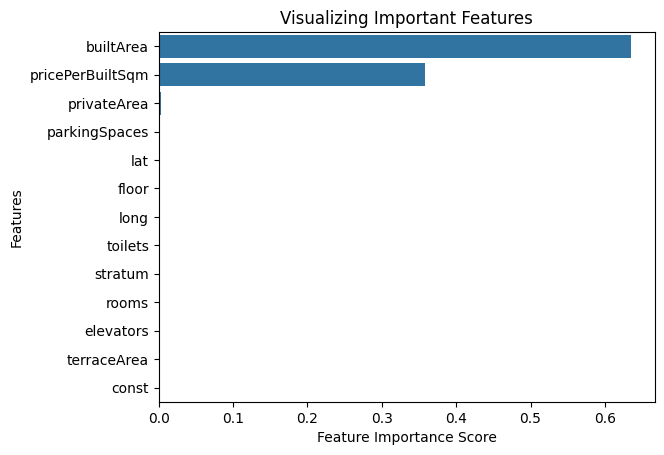

In [ ]:
# Inicializar  el modelo
rfr = RandomForestRegressor(random_state=random_state, n_estimators=n_estimators)
rfr.fit(X_train, y_train)

# Evaluar el modelo en el conjunto de prueba
y_pred = rfr.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Model Mean Squared Error: {mse:.4f}')
print(f'Model R-squared: {r2:.4f}')

# Visualizar la importancia de las características
feature_scores = pd.Series(rfr.feature_importances_, index=X_train.columns).sort_values(ascending=False)
print(feature_scores)

sns.barplot(x=feature_scores, y=feature_scores.index)
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.show()




**CONCLUSION DEL MODELO**

1. Este modelo es efectivo para predecir el precio de la propiedad, con un MSE bajo y un alto R^2, lo que sugiere un buen ajuste a los datos.
2. las variables que tiene mas relevancia en el modelo son: builtArea           0.635303
pricePerBuiltSqm    0.358216

### **KNN**
kNN puede adaptarse a cualquier tipo de función de regresión, siempre que los datos tengan una estructura clara y una métrica de distancia adecuada.

Es un modelo simple y fácilmente interpretabl

**ELECCION DE DATOS DE PRUEBAS Y ENTRENAMIENTO Y SE ESCALAN LOS DATOS**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Definir variable dependiente e independientes
dependent_variable = "TRF_price"
independent_vars = list(geodatos2.columns)
independent_vars.remove(dependent_variable)

# Dividir en conjunto de entrenamiento y prueba
train_data, test_data = train_test_split(geodatos2, test_size=0.2, random_state=0)

X_train = train_data[independent_vars]
y_train = train_data[dependent_variable]
X_test = test_data[independent_vars]
y_test = test_data[dependent_variable]

# Escalar los datos
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


CREACION DEL MODELO

---



In [ ]:
# Crear el modelo KNN
knn = KNeighborsRegressor(n_neighbors=5)

# Entrenar el modelo
knn.fit(X_train_scaled, y_train)

# Predecir en el conjunto de prueba
y_pred = knn.predict(X_test_scaled)

EVALUACION DEL MODELO

In [ ]:
# Calcular métricas de evaluación
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Model Mean Squared Error: {mse:.4f}')
print(f'Model R-squared: {r2:.4f}')

Model Mean Squared Error: 0.0198
Model R-squared: 0.7451


OPTIMIZACION DEL MODELO

GridSearch es una técnica para encontrar el mejor conjunto de hiperparámetros

In [ ]:
from sklearn.model_selection import GridSearchCV

# Definir la búsqueda de hiperparámetros
param_grid = {'n_neighbors': np.arange(1, 30)}
knn = KNeighborsRegressor()

# Configurar la búsqueda
knn_cv = GridSearchCV(knn, param_grid, cv=5)

# Entrenar la búsqueda
knn_cv.fit(X_train_scaled, y_train)

# Mejor número de vecinos
print(f"Best number of neighbors: {knn_cv.best_params_['n_neighbors']}")

# Evaluar el mejor modelo
best_knn = knn_cv.best_estimator_
y_pred = best_knn.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Optimized Model Mean Squared Error: {mse:.4f}')
print(f'Optimized Model R-squared: {r2:.4f}')


Best number of neighbors: 7
Optimized Model Mean Squared Error: 0.0196
Optimized Model R-squared: 0.7477


CONCLUSIONES DEL MODELO

el modelo KNN es bastante efectivo para capturar la relación entre las variables.
después de realizar una búsqueda de hiperparámetros, se determinó que el mejor número de vecinos (k) para el modelo KNN es 7


### **CONCLUSIONES GENERALES**
El bajo MSE y el alto R-cuadrado del modelo de Random Forest sugieren que este modelo generaliza bien para predecir nuevos datos no vistos.

El MSE más alto y el R-cuadrado más bajo del modelo de regresión lineal sugieren que puede haber problemas de sobreajuste o que el modelo no se está generalizando tan bien para datos fuera de la muestra.

El modelo de Random Forest parece ser más preciso y generalizable en comparación con el modelo de regresión lineal en este escenario de los precios de inmuebles.

El modelo Random Forest es superior en términos de precisión y capacidad explicativa, el modelo KNN es una alternativa viable y puede ser preferido en casos donde la interpretabilidad y la simplicidad son importantes.

El modelo KNN puede capturar mejor las relaciones no lineales en los datos que el modelo de regresion lineal .